In [1]:
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"

import matplotlib.pyplot as plt
import seaborn as sns
plt.style.use('ggplot')
%matplotlib inline
np.set_printoptions(suppress=True)

import pandas as pd
import numpy as np
pd.set_option('display.max_rows', 100)
pd.set_option('display.max_columns', 100)
pd.set_option('display.width', 500)

import re
import pprint
pp = pprint.PrettyPrinter(indent=4)

In [2]:
def load_data():
    """
    Load 
    """
    #https://data.stanford.edu/hcmst
    df_merged = pd.read_stata('/Users/kirill.kogan/Documents/data/ICPSR_30103/HCMST_ver_3.04.dta')
    df4 = pd.read_stata('/Users/kirill.kogan/Documents/data/ICPSR_30103/wave_4_supplement_v1_2.dta')
    df5 = pd.read_stata('/Users/kirill.kogan/Documents/data/ICPSR_30103/HCMST_wave_5_supplement_ver_1.dta')
    df_merged = pd.merge(df_merged, df4, on='caseid_new', how='left')
    df_merged = pd.merge(df_merged, df5, on='caseid_new', how='left')
    return df_merged


df_raw = load_data()


## Clean

In [3]:
def clean_data(df_dirty):
    """
    Repeatable clean
    """
    df = df_dirty.copy()
    #only included partnered at start of study
    df = df[df['qflag'] == 'partnered']
    #turn categoricals into strings
    df[df.loc[:, df.dtypes == 'category'].columns] = df.loc[:, df.dtypes == 'category'].astype(str)
    df.replace({'nan':np.nan}, inplace=True)

    # build up a dataframe for visualization and ML
    df_ml = pd.DataFrame()
    df_ml['caseid_new'] = df['caseid_new']
    #dropnas
    # df =  df[~df['w2345_combo_breakup'].isna()]
    
    # TODO follow up with instructor about whether weights should be utilized
       
    # other 
    
    #
    # age
    #
    df_ml['age_difference'] = df['age_difference']
    df_ml['ppage'] = df['ppage'].astype('int')
    df_ml['partner_age'] = df['q9']
    df_ml['partner_years_younger'] = df_ml['ppage']-df_ml['partner_age']
    
    #
    # sexual orientation
    #
    df_ml['ppgender']= (df['ppgender'] == 'female').astype('int')
    df_ml['lgb'] = (df['glbstatus'] == 'glb').astype('int')

    #
    # money & lifestyle
    #
    df_ml['hhinc'] = df['hhinc']
    df_ml['pphh_internet'] = (df['ppnet'] == 'yes').astype('int')
    df_ml['ppmsacat_metro'] = (df['ppmsacat'] == 'metro').astype('int')

    #
    # education
    #
    df_ml['respondent_yrsed'] = df['respondent_yrsed']
    df_ml['partner_yrsed'] = df['partner_yrsed']

    #
    # family
    #
    df_ml['parental_approval'] = df['parental_approval'].replace({'approve':1, "don't approve or don't know":0})
    df_ml['respondent_mom_yrsed'] = df['respondent_mom_yrsed']
    df_ml['respondent_mom_yrsed'].fillna(np.mean(df['respondent_mom_yrsed']) , inplace=True)
    df_ml['partner_mom_yrsed'] = df['partner_mom_yrsed']
    df_ml['partner_mom_yrsed'].fillna(np.mean(df['partner_mom_yrsed']) , inplace=True)
    
    df_ml['children_in_hh'] = df['children_in_hh']
    df_ml['pphouseholdsize'] = df['pphouseholdsize']

    # 
    # ethnicity & nationality
    #
    df_ml['us_raised'] = (df['q15a1_compressed'] == 'United States').astype('int')

    #
    # religion
    #
    df_ml['respondent_religion'] = df['papreligion']
    df_ml['partner_religion'] = df['q7b'].replace({'refused':np.nan})
    df_ml['respondent_religious'] = (df_ml['respondent_religion'] != 'None').astype('int')
    df_ml['partner_religious'] = (df_ml['partner_religion'] != 'None').astype('int')
    df_ml['same_religious_beliefs'] = (df_ml['partner_religion'] == df_ml['respondent_religion']).astype('int')

    #
    # politics
    #
    df_ml['partner_politics'] = df['q12'].replace({'refused':np.nan})
    df_ml['respondent_politics'] = df['pppartyid3']
    df_ml['same_or_ambivalent_politics'] = ((df_ml['partner_politics'] == df_ml['respondent_politics']) | (df_ml['partner_politics'] == 'no preference')).astype('int')
    
    #
    # type of relationship
    #
    df_ml['1_married'] = df['married'].replace({'married':1,'not married':0}) # main survey 1
    df_ml['1_unmarried_sex_partner'] = (df['s2'] == 'yes, i have a sexual partner (boyfriend or girlfriend)').astype('int')
    df_ml['1_unmarried_rom_partner'] = (df['s2'] == 'i have a romantic partner who is not yet a sexual partner').astype('int')
    df_ml['coresident'] = df['coresident'].replace({'Yes':1, 'No':0})

    #
    # qualitative
    #
    df_ml['relationship_quality'] = df['relationship_quality']


    #
    # how they met
    # 
    df_ml['met_through_friends'] = (df['met_through_friends'] == 'meet through friends').astype('int')
    df_ml['met_through_as_neighbors'] = df['met_through_as_neighbors'].replace({"did not meet through or as neighbors":0,"met through or as neighbors":1})
    df_ml['met_through_family'] = df['met_through_family'].replace({"met through family":1,"not met through family":0})
    # bunch of NAs
    #df_ml['met_through_as_coworkers'] = df['met_through_as_coworkers']

    # 
    # relationship histories
    #
    # #df_ml['past_marriages'] = need to do some math here Q17A & Q17B

    #
    # targets
    #
    df_ml['w2_broke_up_y'] = (df['w2_broke_up'] == 'broke up').astype('int')
    df_ml['rel_length_start'] = df['how_long_relationship']
    # this is questionable because I don't think I know exactly when they broke up
    df_ml['rel_length_at_w2'] = df_ml['rel_length_start'] + (df['w2_days_elapsed']/365)
    df_ml['rel_length_at_w2'].fillna(df_ml['rel_length_start'] + np.mean(df['w2_days_elapsed'])/365, inplace=True)
    
    #
    # 
    #
    
    #
    # Drop NA
    # hold off on drop na to do auto viz
    #df_ml = df_ml.dropna()
    
    # drop redundant columns
    return df_ml.drop(['rel_length_start', 'caseid_new'], axis=1)

df = clean_data(df_raw)
df.sample(50)

,age_difference,ppage,partner_age,partner_years_younger,ppgender,lgb,hhinc,pphh_internet,ppmsacat_metro,respondent_yrsed,partner_yrsed,parental_approval,respondent_mom_yrsed,partner_mom_yrsed,children_in_hh,pphouseholdsize,us_raised,respondent_religion,partner_religion,respondent_religious,partner_religious,same_religious_beliefs,partner_politics,respondent_politics,same_or_ambivalent_politics,1_married,1_unmarried_sex_partner,1_unmarried_rom_partner,coresident,relationship_quality,met_through_friends,met_through_as_neighbors,met_through_family,w2_broke_up_y,rel_length_at_w2
306,6.0,54,60.0,-6.0,1,1,67250.0,1,1,13.0,12.0,1.0,12.0,5.500000,0,2,1,none,none,1,1,1,democrat,democrat,1,0,1,0,1.0,good,0,0.0,0.0,0,35.068493
509,1.0,50,49.0,1.0,1,0,6250.0,1,0,12.0,2.5,NaN,12.0,2.500000,0,1,1,other christian,other christian,1,1,1,republican,republican,1,1,0,0,0.0,fair,1,0.0,1.0,0,18.084932
1174,1.0,39,38.0,1.0,0,0,37250.0,0,1,17.0,16.0,0.0,16.0,16.000000,1,3,1,"other non-christian, please specify:",other christian,1,1,0,democrat,democrat,1,1,0,0,1.0,fair,1,0.0,0.0,0,18.073973
1955,1.0,62,61.0,1.0,0,0,55000.0,0,1,12.0,12.0,NaN,12.0,7.500000,0,2,1,"protestant (e.g., methodist, lutheran, presbyt...","protestant (e.g. methodist, lutheran, presbyte...",1,1,0,no preference,republican,1,1,0,0,1.0,good,1,0.0,0.0,0,37.071233
1849,5.0,49,44.0,5.0,0,1,112250.0,1,1,16.0,13.0,1.0,13.0,17.000000,0,2,1,mormon,other christian,1,1,0,democrat,republican,0,0,1,0,1.0,excellent,0,0.0,0.0,0,13.063014
926,0.0,57,57.0,0.0,1,0,45000.0,1,0,12.0,13.0,NaN,13.0,12.000000,0,3,1,"protestant (e.g., methodist, lutheran, presbyt...","protestant (e.g. methodist, lutheran, presbyte...",1,1,0,democrat,democrat,1,1,0,0,1.0,excellent,1,0.0,1.0,0,40.073973
1347,2.0,56,54.0,2.0,0,0,92250.0,1,1,13.0,12.0,NaN,10.0,12.000000,2,5,1,catholic,catholic,1,1,1,democrat,democrat,1,1,0,0,1.0,excellent,1,0.0,0.0,0,35.065753
1693,1.0,38,39.0,-1.0,1,0,22250.0,1,1,12.0,14.0,1.0,12.0,12.000000,4,6,1,"protestant (e.g., methodist, lutheran, presbyt...",other christian,1,1,0,republican,republican,1,1,0,0,1.0,excellent,0,0.0,0.0,0,14.073973
3005,0.0,41,41.0,0.0,0,0,162250.0,1,1,20.0,20.0,1.0,16.0,17.000000,0,3,1,jewish,none,1,1,0,democrat,democrat,1,0,1,0,1.0,excellent,1,1.0,0.0,0,18.069159
2740,5.0,38,33.0,5.0,1,1,6250.0,0,0,14.0,10.0,1.0,14.0,13.000000,0,2,1,other christian,none,1,1,0,democrat,democrat,1,0,1,0,1.0,fair,1,0.0,0.0,0,3.569159


Shape of your Data Set: (2964, 37)
Classifying variables in data set...
    Number of Numeric Columns =  6
    Number of Integer-Categorical Columns =  3
    Number of String-Categorical Columns =  14
    Number of Factor-Categorical Columns =  0
    Number of String-Boolean Columns =  1
    Number of Numeric-Boolean Columns =  9
    Number of Discrete String Columns =  0
    Number of NLP String Columns =  0
    Number of Date Time Columns =  0
    Number of ID Columns =  1
    Number of Columns to Delete =  2
    36 Predictors classified...
        This does not include the Target column(s)
    3 variables removed since they were ID or low-information variables
    List of variables removed: ['caseid_new', 'respondent_religious', 'partner_religious']

################### Binary-Class VISUALIZATION Started #####################
Data Set Shape: 2964 rows, 34 cols

Too many columns to print
   Columns to delete:
"   ['respondent_religious', 'partner_religious']"
   Boolean variables %s 

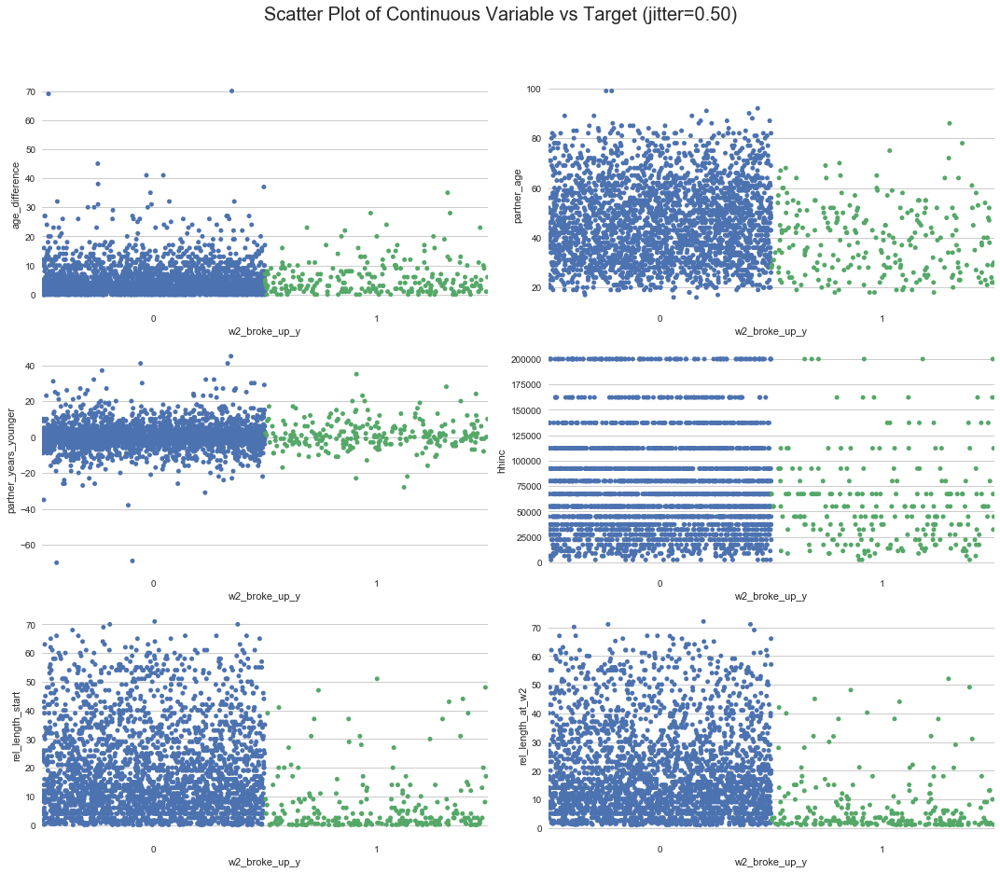

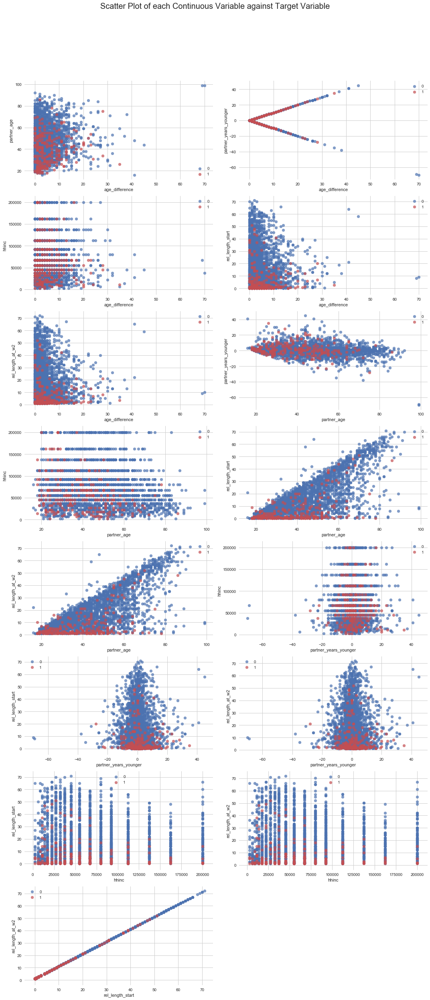

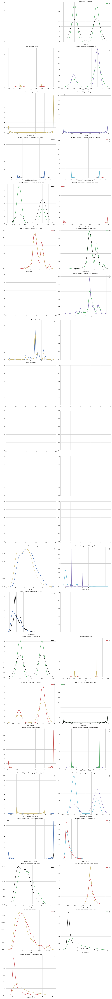

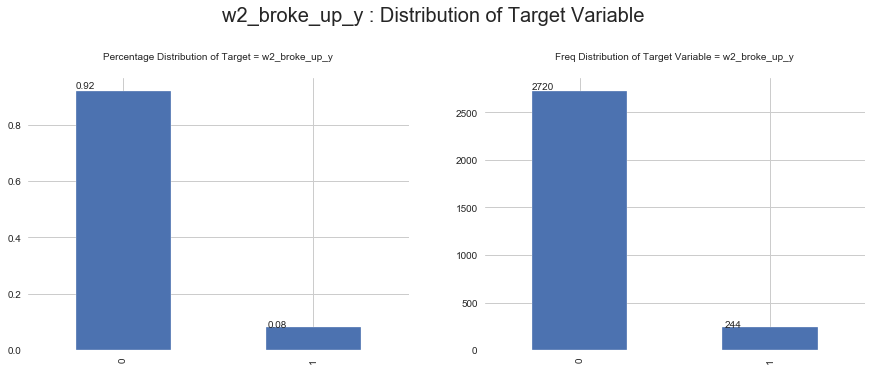

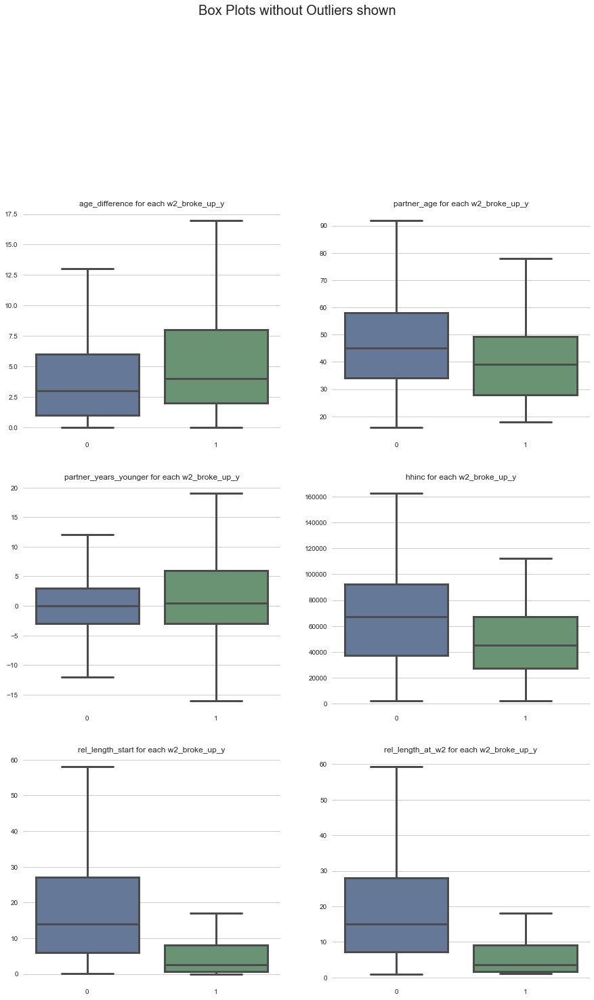

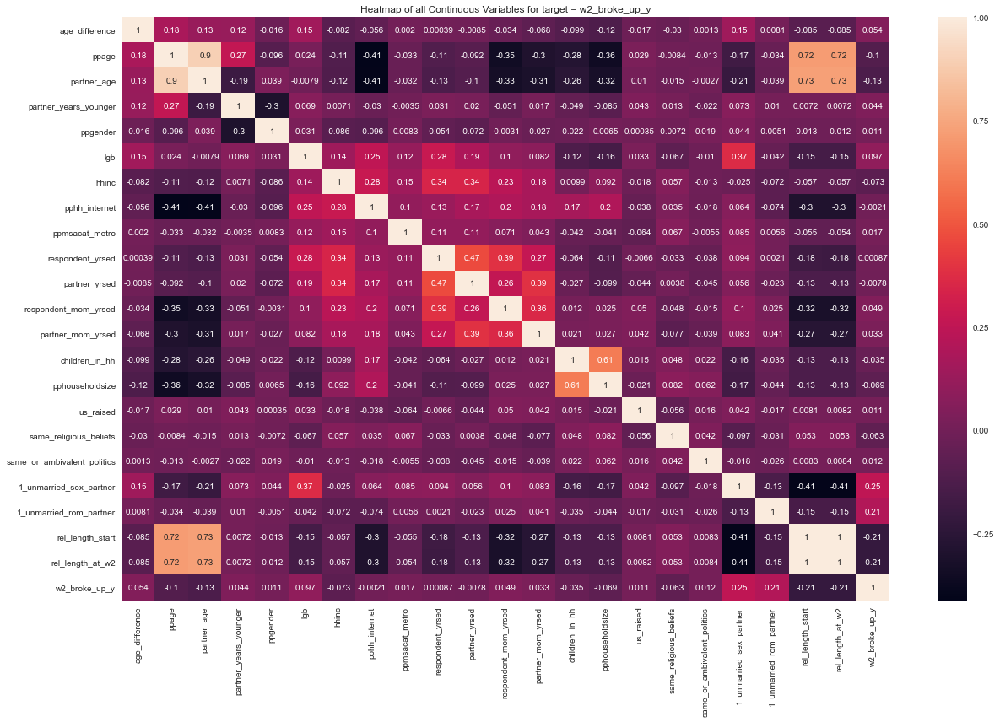

In [10]:
dft = AV.AutoViz('', ',', 'w2_broke_up_y', df, verbose=1, max_cols_analyzed=40)


## Interesting columns for later

In [82]:
#df[df['Q18A_3'] == 0]
df['q18a_3'].value_counts()

have neither DP nor CU    994
have either DP or CU      169
refused                     8
Name: q18a_3, dtype: int64

In [86]:
df.groupby(['q18a_3','pp5_ppmarit','w2345_combo_breakup']).count()

caseid_new  weight1  weight2  ppage  ppagecat  ppagect4  ppeduc  ppeducat  ppethm  ppgender  pphhhead  pphouseholdsize  pphouse  ppincimp  hhinc  ppmarit  ppmsacat  ppreg4  ppreg9  pprent  ppt01  ppt1317  ppt18ov  ppt25  ppt612  children_in_hh  ppwork  ppnet  ppq14arace  pphispan  pprace_white  pprace_black  pprace_nativeamerican  pprace_asianindian  pprace_chinese  pprace_filipino  pprace_japanese  pprace_korean  pprace_vietnamese  pprace_otherasian  pprace_hawaiian  pprace_guamanian  pprace_samoan  pprace_otherpacificislander  pprace_someotherrace  papglb_friend  pppartyid3  papevangelical  papreligion  ppppcmdate_yrmo  ...  w5_q10  w5_nonmbtiming_year  w5_nonmbtiming_month  w5_broke_up  w5_HCMST_interview_fin_yrmo  responded_to_w234or5  pp5_ppage  pp5_ppagecat  pp5_ppagect4  pp5_ppeduc  pp5_ppeducat  pp5_ppethm  pp5_ppgender  pp5_pphhhead  pp5_pphhsize  pp5_pphouse  pp5_ppincimp  pp5_ppcmdate_yrmo  pp5_newer  \
q18a_3                 pp5_ppmarit         w2345_combo_breakup                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                        ...                                                                                                                                                                                                                                                                                                      
refused                Married             0.0                         1.0      1.0      1.0    1.0       1.0       1.0     1.0       1.0     1.0       1.0       1.0              1.0      1.0       1.0    1.0      1.0       1.0     1.0     1.0     1.0    1.0      1.0      1.0    1.0     1.0             1.0     1.0    1.0         1.0       1.0           1.0           1.0                    1.0                 1.0             1.0              1.0              1.0            1.0                1.0                1.0              1.0               1.0            1.0                          1.0                   1.0            1.0         1.0             1.0          1.0              1.0  ...     0.0                  0.0                   0.0          1.0                          1.0                   1.0        1.0           1.0           1.0         1.0           1.0         1.0           1.0           1.0           1.0          1.0           1.0                1.0        1.0   
                                           1.0                         NaN      NaN      NaN    NaN       NaN       NaN     NaN       NaN     NaN       NaN       NaN              NaN      NaN       NaN    NaN      NaN       NaN     NaN     NaN     NaN    NaN      NaN      NaN    NaN     NaN             NaN     NaN    NaN         NaN       NaN           NaN           NaN                    NaN                 NaN             NaN              NaN              NaN            NaN                NaN                NaN              NaN               NaN            NaN                          NaN                   NaN            NaN         NaN             NaN          NaN              NaN  ...     NaN                  NaN                   NaN          NaN                          NaN                   NaN        NaN           NaN           NaN         NaN           NaN         NaN           NaN           NaN           NaN          NaN           NaN                NaN        NaN   
                       Widowed             0.0                         NaN      NaN      NaN    

# marital status at start of survey

In [20]:
# marital status survey preceded survey qualification survey
df.groupby(['ppmarit', 'qflag']).count()

caseid_new  weight1  weight2  ppage  ppagecat  ppagect4  ppeduc  ppeducat  ppethm  ppgender  pphhhead  pphouseholdsize  pphouse  ppincimp  hhinc  ppmsacat  ppreg4  ppreg9  pprent  ppt01  ppt1317  ppt18ov  ppt25  ppt612  children_in_hh  ppwork  ppnet  ppq14arace  pphispan  pprace_white  pprace_black  pprace_nativeamerican  pprace_asianindian  pprace_chinese  pprace_filipino  pprace_japanese  pprace_korean  pprace_vietnamese  pprace_otherasian  pprace_hawaiian  pprace_guamanian  pprace_samoan  pprace_otherpacificislander  pprace_someotherrace  papglb_friend  pppartyid3  papevangelical  papreligion  ppppcmdate_yrmo  pppadate_yrmo  ...  w5_civ_month  w5_q9  w5_q10  w5_nonmbtiming_year  w5_nonmbtiming_month  w5_broke_up  w5_HCMST_interview_fin_yrmo  w2345_combo_breakup  responded_to_w234or5  pp5_ppage  pp5_ppagecat  pp5_ppagect4  pp5_ppeduc  pp5_ppeducat  pp5_ppethm  pp5_ppgender  pp5_pphhhead  pp5_pphhsize  pp5_pphouse  \
ppmarit             qflag                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                      ...                                                                                                                                                                                                                                                                                                    
married             partnered                                            1715     1715     1715   1715      1715      1715    1715      1715    1715      1715      1715             1715     1715      1715   1715      1715    1715    1715    1715   1715     1715     1715   1715    1715            1715    1715   1715        1715      1715          1715          1715                   1715                1715            1715             1715             1715           1715               1715               1715             1715              1715           1715                         1715                  1715           1706        1715            1690         1708             1715           1715  ...             0      0       0                    0                     0          763                          763                 1556                  1715       1715          1715          1715        1715          1715        1715          1715          1715          1715         1715   
                    no spouse or partner or otherwise unqualified          21       21        0     21        21        21      21        21      21        21        21               21       21        21     21        21      21      21      21     21       21       21     21      21              21      21     21          21        21            21            21                     21                  21              21               21               21             21                 21                 21               21                21             21                           21                    21             21          21              19           21               21             21  ...             0      0       0                    0                     0            0                            0                    0                     0         21            21            21          21            21          21            21            21            21           21   
widowed             partnered                                          

In [16]:
df.groupby(['q21b', 'ppmarit']).count()

caseid_new  weight1  weight2  ppage  ppagecat  ppagect4  ppeduc  ppeducat  ppethm  ppgender  pphhhead  pphouseholdsize  pphouse  ppincimp  hhinc  ppmsacat  ppreg4  ppreg9  pprent  ppt01  ppt1317  ppt18ov  ppt25  ppt612  children_in_hh  ppwork  ppnet  ppq14arace  pphispan  pprace_white  pprace_black  pprace_nativeamerican  pprace_asianindian  pprace_chinese  pprace_filipino  pprace_japanese  pprace_korean  pprace_vietnamese  pprace_otherasian  pprace_hawaiian  pprace_guamanian  pprace_samoan  pprace_otherpacificislander  pprace_someotherrace  papglb_friend  pppartyid3  papevangelical  papreligion  ppppcmdate_yrmo  pppadate_yrmo  ...  w5_civ_month  w5_q9  w5_q10  w5_nonmbtiming_year  w5_nonmbtiming_month  w5_broke_up  w5_HCMST_interview_fin_yrmo  w2345_combo_breakup  responded_to_w234or5  pp5_ppage  pp5_ppagecat  pp5_ppagect4  pp5_ppeduc  pp5_ppeducat  pp5_ppethm  pp5_ppgender  pp5_pphhhead  pp5_pphhsize  pp5_pphouse  pp5_ppincimp  pp5_ppmarit  \
q21b ppmarit                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                          ...                                                                                                                                                                                                                                                                                                                               
0.0  married                     1.0      1.0      1.0    1.0       1.0       1.0     1.0       1.0     1.0       1.0       1.0              1.0      1.0       1.0    1.0       1.0     1.0     1.0     1.0    1.0      1.0      1.0    1.0     1.0             1.0     1.0    1.0         1.0       1.0           1.0           1.0                    1.0                 1.0             1.0              1.0              1.0            1.0                1.0                1.0              1.0               1.0            1.0                          1.0                   1.0            1.0         1.0             1.0          1.0              1.0            1.0  ...           0.0    0.0     0.0                  0.0                   0.0          0.0                          0.0                  0.0                   1.0        1.0           1.0           1.0         1.0           1.0         1.0           1.0           1.0           1.0          1.0           1.0          1.0   
     widowed                     NaN      NaN      NaN    NaN       NaN       NaN     NaN       NaN     NaN       NaN       NaN              NaN      NaN       NaN    NaN       NaN     NaN     NaN     NaN    NaN      NaN      NaN    NaN     NaN             NaN     NaN    NaN         NaN       NaN           NaN           NaN                    NaN                 NaN             NaN              NaN              NaN            NaN                NaN                NaN              NaN               NaN            NaN                          NaN                   NaN            NaN         NaN             NaN          NaN              NaN            NaN  ...           NaN    NaN     NaN                  NaN                   NaN          NaN                          NaN                  NaN                   NaN        NaN           NaN           NaN         NaN           NaN         NaN           NaN           NaN           NaN          NaN           NaN          NaN   
     divorced                    NaN      NaN      NaN    NaN       NaN       NaN     

In [ ]:
#children
['PP5_PPT612', 'PP5_PPT1317', 'GENDER_ATTRACTION']
#adults
['PP5_PPT18OV']
#['HOW_LONG_AGO_FIRST_MET']
#['HOW_LONG_AGO_FIRST_ROMANTIC']
#['HOW_LONG_AGO_FIRST_COHAB'] —> buckets of cohabitation
#
#['ppage'] participant age ['q9'] partner age  —> make some age difference features
## 

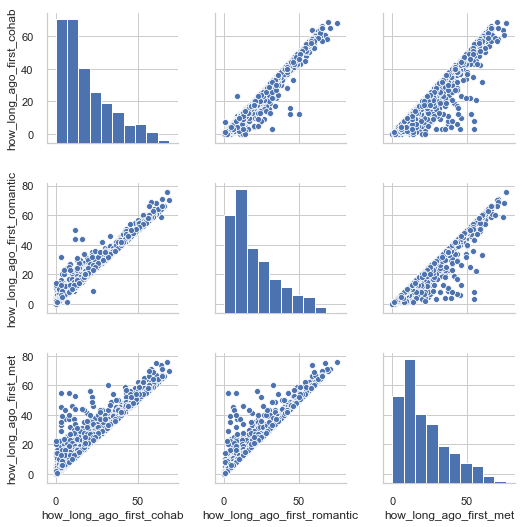

In [31]:
sns.pairplot(df[['how_long_ago_first_cohab', 'how_long_ago_first_romantic','how_long_ago_first_met']].dropna())

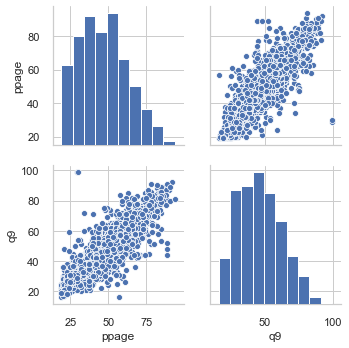

In [33]:
sns.pairplot(df[['ppage', 'q9']].dropna())